In [1]:
import panel as pn
pn.extension()
from os import listdir
from os.path import isfile, join
import matplotlib.pyplot as plt
import holoviews as hv
hv.extension('plotly')


In [2]:
def return_tif_tci_list():
    mypath='/home/ec2-user/data/flippery'
    onlyfiles = sorted([f for f in listdir(mypath) if isfile(join(mypath, f))])
    return(onlyfiles)

In [3]:
tif_list = return_tif_tci_list()

In [4]:
print(tif_list)

['20200222_14TPP_00_R10m_TCI.tif', '20200308_14TPP_00_R10m_TCI.tif', '20200407_14TPP_00_R10m_TCI.tif', '20200417_14TPP_00_R10m_TCI.tif', '20200422_14TPP_00_R10m_TCI.tif', '20200527_14TPP_00_R10m_TCI.tif', '20200601_14TPP_00_R10m_TCI.tif', '20200611_14TPP_00_R10m_TCI.tif', '20200616_14TPP_00_R10m_TCI.tif', '20200711_14TPP_00_R10m_TCI.tif', '20200716_14TPP_00_R10m_TCI.tif', '20200721_14TPP_00_R10m_TCI.tif', '20200731_14TPP_00_R10m_TCI.tif', '20200825_14TPP_00_R10m_TCI.tif', '20200830_14TPP_00_R10m_TCI.tif', '20200904_14TPP_00_R10m_TCI.tif', '20200914_14TPP_01_R10m_TCI.tif', '20200919_14TPP_00_R10m_TCI.tif', '20200924_14TPP_00_R10m_TCI.tif', '20200929_14TPP_00_R10m_TCI.tif', '20201004_14TPP_00_R10m_TCI.tif', '20201009_14TPP_00_R10m_TCI.tif', '20201029_14TPP_00_R10m_TCI.tif', '20201103_14TPP_00_R10m_TCI.tif', '20201108_14TPP_00_R10m_TCI.tif', '20201128_14TPP_00_R10m_TCI.tif', '20201208_14TPP_00_R10m_TCI.tif', '20201228_14TPP_00_R10m_TCI.tif']


In [5]:
def return_tci_please(tif_file):
    the_plot = hv.RGB.load_image(tif_file).opts(width=600, height=600)
    return(the_plot)

In [6]:
my_dir = '/home/ec2-user/data/flippery'
my_tif = f'{my_dir}/{tif_list[0]}'

#return_tci_please(my_tif)

In [7]:
title = '## True Color Image Display Panel App'

tif_select = pn.widgets.Select(name='tif1', options=tif_list)

@pn.depends(tif_select.param.value)
def refresh_tci(geo1):
    return(return_tci_please(f'{my_dir}/{tif_select.value}'))

Row
    [0] Column
        [0] Markdown(str)
        [1] ParamFunction(function, _pane=HoloViews, defer_load=False, height=600, sizing_mode='fixed', width=800)
        [2] Select(name='tif1', options=['20200222_14TPP_00_R10m_T...], value='20200222_14TPP_00_R10m_TC...)
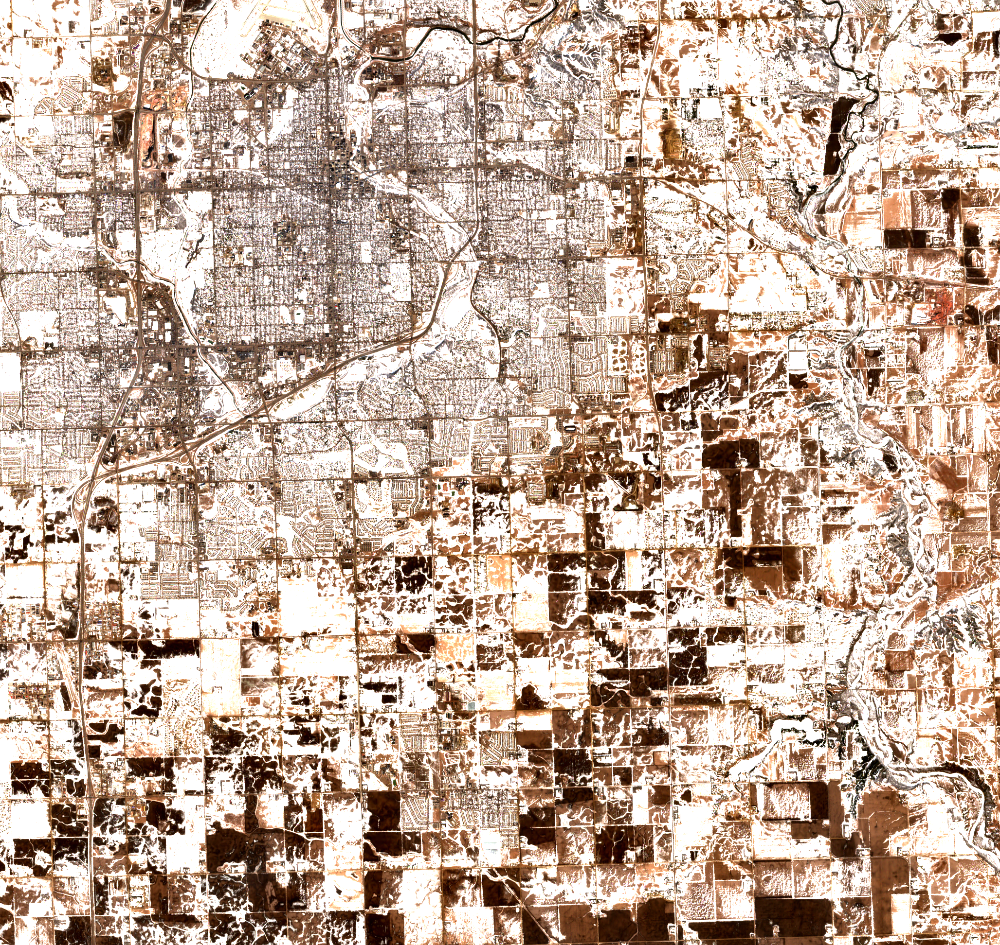

In [8]:
row = pn.Row(
    pn.Column(title, pn.panel(refresh_tci, height=600, width=800), tif_select)
)

row.servable()